In [2]:
import pandas as pd 
import datetime as dt
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np

In [3]:
data = pd.read_csv("C:/Users/Arabtech/Downloads/jupyter_files/Final project_DSM/walmart-sales.csv")

In [4]:
data.head(10)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
5,1,12-03-2010,1439541.59,0,57.79,2.667,211.380643,8.106
6,1,19-03-2010,1472515.79,0,54.58,2.720,211.215635,8.106
7,1,26-03-2010,1404429.92,0,51.45,2.732,211.018042,8.106
8,1,02-04-2010,1594968.28,0,62.27,2.719,210.820450,7.808
9,1,09-04-2010,1545418.53,0,65.86,2.770,210.622857,7.808


In [5]:
data['Store'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [7]:
# Check for missing values
print(data.isnull().sum())

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64


In [8]:
# Check for duplicated rows
print(data.duplicated().sum())

0


In [9]:
data.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [10]:
#Negative temperatures is normal no need to remove it
#No other negatives to deal with

In [11]:
#To find some relations between columns ,I will exclude the "Date" because it is object ,and continue with numerical columns
# Exclude 'Date' column
numerical_columns = data.columns.drop("Date")

In [12]:
print(data)
print("*"*90)
print(numerical_columns)

      Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0         1  05-02-2010    1643690.90             0        42.31       2.572   
1         1  12-02-2010    1641957.44             1        38.51       2.548   
2         1  19-02-2010    1611968.17             0        39.93       2.514   
3         1  26-02-2010    1409727.59             0        46.63       2.561   
4         1  05-03-2010    1554806.68             0        46.50       2.625   
...     ...         ...           ...           ...          ...         ...   
6430     45  28-09-2012     713173.95             0        64.88       3.997   
6431     45  05-10-2012     733455.07             0        64.89       3.985   
6432     45  12-10-2012     734464.36             0        54.47       4.000   
6433     45  19-10-2012     718125.53             0        56.47       3.969   
6434     45  26-10-2012     760281.43             0        58.85       3.882   

             CPI  Unemployment  
0     

In [13]:
# Calculate correlation for numerical columns
correlation_matrix = data[numerical_columns].corr()
correlation_matrix

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


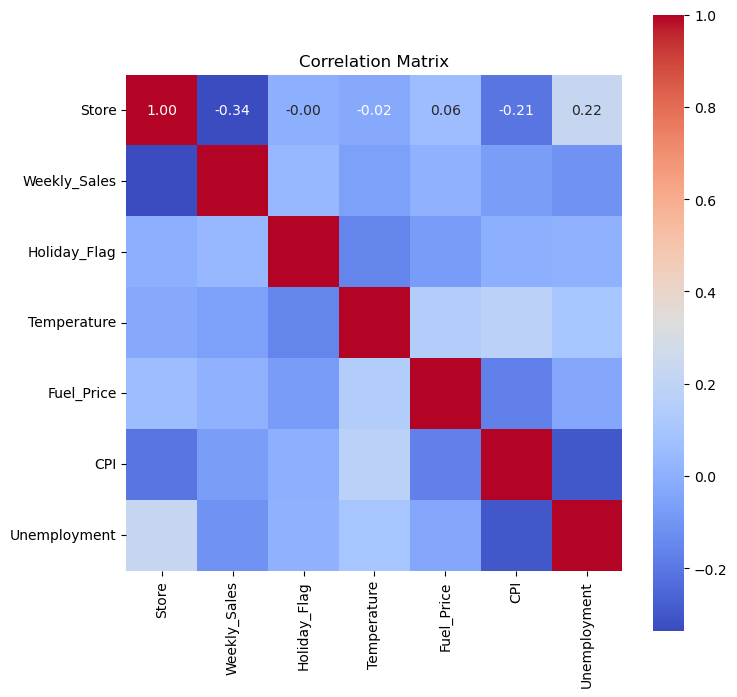

In [14]:
# Visualize Correlation Matrix
plt.figure(figsize=(8, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Correlation Matrix')
plt.show()

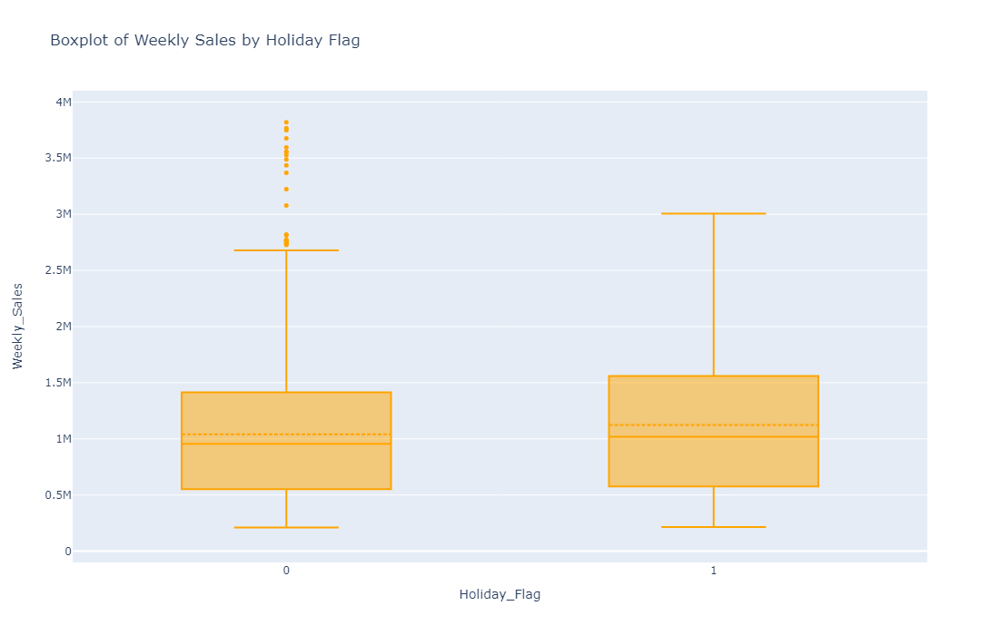

Descriptive Statistics for Weekly Sales by Holiday Flag:
               count          mean            std        min          25%  \
Holiday_Flag                                                                
0             5985.0  1.041256e+06  558957.436147  209986.25  551378.3900   
1              450.0  1.122888e+06  627684.931884  215359.21  575865.4825   

                     50%          75%         max  
Holiday_Flag                                       
0              956211.20  1414343.530  3818686.45  
1             1018538.04  1555213.175  3004702.33  
Sum of Weekly Sales outliers when Holiday_Flag is 0: 78994129.66
Sum of Weekly Sales outliers when Holiday_Flag is 1: 25954464.46


In [15]:
fig = px.box(data, x='Holiday_Flag', y='Weekly_Sales', title='Boxplot of Weekly Sales by Holiday Flag',
             category_orders={"Holiday_Flag": ["Non-Holiday", "Holiday"]})

fig.update_traces(marker=dict(color='orange', size=5), boxmean=True)

# Change the values of the y-axis
fig.update_yaxes(tickvals=[0, 0.5e6, 1e6, 1.5e6, 2e6, 2.5e6, 3e6, 3.5e6, 4e6],
                 ticktext=['0', '0.5M', '1M', '1.5M', '2M', '2.5M', '3M', '3.5M', '4M'])

# Adjust the range of the y-axis
fig.update_yaxes(range=[-0.1e6, 4.1e6])

fig.update_layout(
    width=1100,  
    height=700 
)

fig.show()

# Descriptive statistics for weekly sales by holiday flag
holiday_sales_stats = data.groupby('Holiday_Flag')['Weekly_Sales'].describe()
print("Descriptive Statistics for Weekly Sales by Holiday Flag:")
print(holiday_sales_stats)

# Calculate the interquartile range (IQR)
Q1 = data['Weekly_Sales'].quantile(0.25)
Q3 = data['Weekly_Sales'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers when Holiday_Flag is 0
outliers_holiday_0 = data[(data['Holiday_Flag'] == 0) & ((data['Weekly_Sales'] < lower_bound) | (data['Weekly_Sales'] > upper_bound))]

# Identify outliers when Holiday_Flag is 1
outliers_holiday_1 = data[(data['Holiday_Flag'] == 1) & ((data['Weekly_Sales'] < lower_bound) | (data['Weekly_Sales'] > upper_bound))]

print("Sum of Weekly Sales outliers when Holiday_Flag is 0:", outliers_holiday_0['Weekly_Sales'].sum())
print("Sum of Weekly Sales outliers when Holiday_Flag is 1:", outliers_holiday_1['Weekly_Sales'].sum())

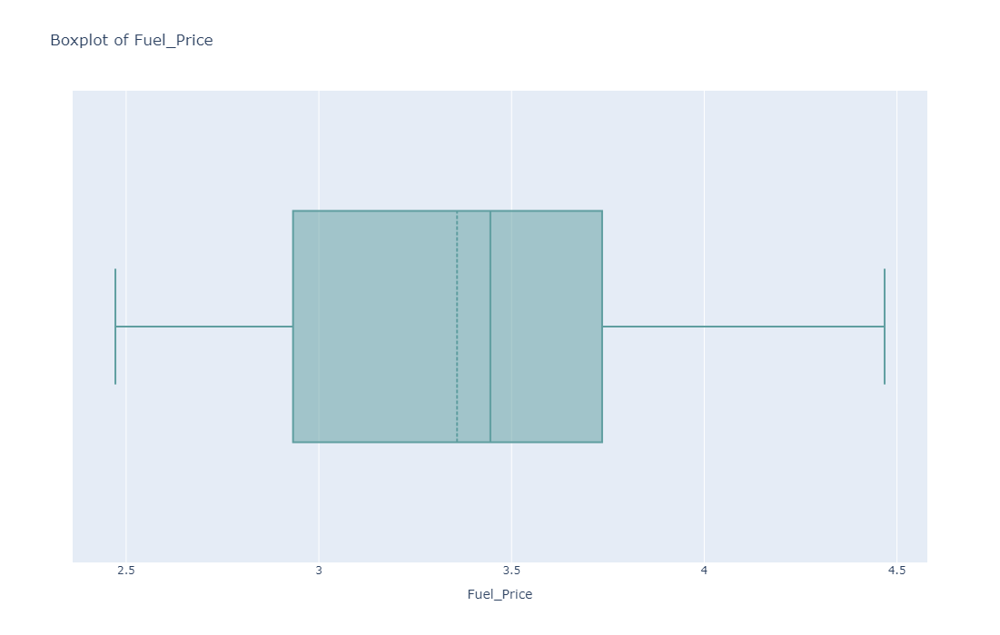

Descriptive Statistics for Fuel_Price:
count    6435.000000
mean        3.358607
std         0.459020
min         2.472000
25%         2.933000
50%         3.445000
75%         3.735000
max         4.468000
Name: Fuel_Price, dtype: float64
Sum of Fuel_Price outliers  0.0


In [16]:
fig = px.box(data, x='Fuel_Price', title='Boxplot of Fuel_Price')

fig.update_traces(marker=dict(color='cadetblue', size=5), boxmean=True)

fig.update_layout(
    width=1100,  
    height=700 
)

fig.show()

# Descriptive statistics for Fuel_Price
Fuel_Price_stats = data['Fuel_Price'].describe()
print("Descriptive Statistics for Fuel_Price:")
print(Fuel_Price_stats)

# Calculate the interquartile range (IQR)
Q1 = data['Fuel_Price'].quantile(0.25)
Q3 = data['Fuel_Price'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_Fuel_Price = data[((data['Fuel_Price'] < lower_bound) | (data['Fuel_Price'] > upper_bound))]

print("Sum of Fuel_Price outliers ", outliers_Fuel_Price['Fuel_Price'].sum())

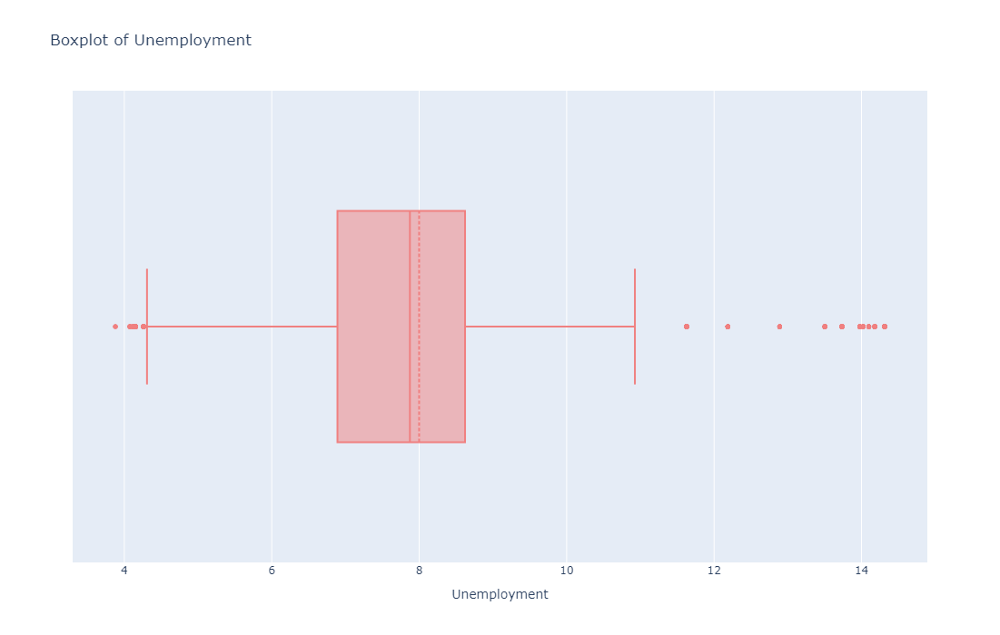

Descriptive Statistics for Unemployment:
count    6435.000000
mean        7.999151
std         1.875885
min         3.879000
25%         6.891000
50%         7.874000
75%         8.622000
max        14.313000
Name: Unemployment, dtype: float64
Sum of Unemployment outliers  5506.237999999999


In [17]:
fig = px.box(data, x='Unemployment', title='Boxplot of Unemployment')

fig.update_traces(marker=dict(color='lightcoral', size=5), boxmean=True)

fig.update_layout(
    width=1100,  
    height=700 
)

fig.show()

# Descriptive statistics for Fuel_Price
Unemployment_stats = data['Unemployment'].describe()
print("Descriptive Statistics for Unemployment:")
print(Unemployment_stats)

# Calculate the interquartile range (IQR)
Q1 = data['Unemployment'].quantile(0.25)
Q3 = data['Unemployment'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_Unemployment = data[((data['Unemployment'] < lower_bound) | (data['Unemployment'] > upper_bound))]

print("Sum of Unemployment outliers ", outliers_Unemployment['Unemployment'].sum())

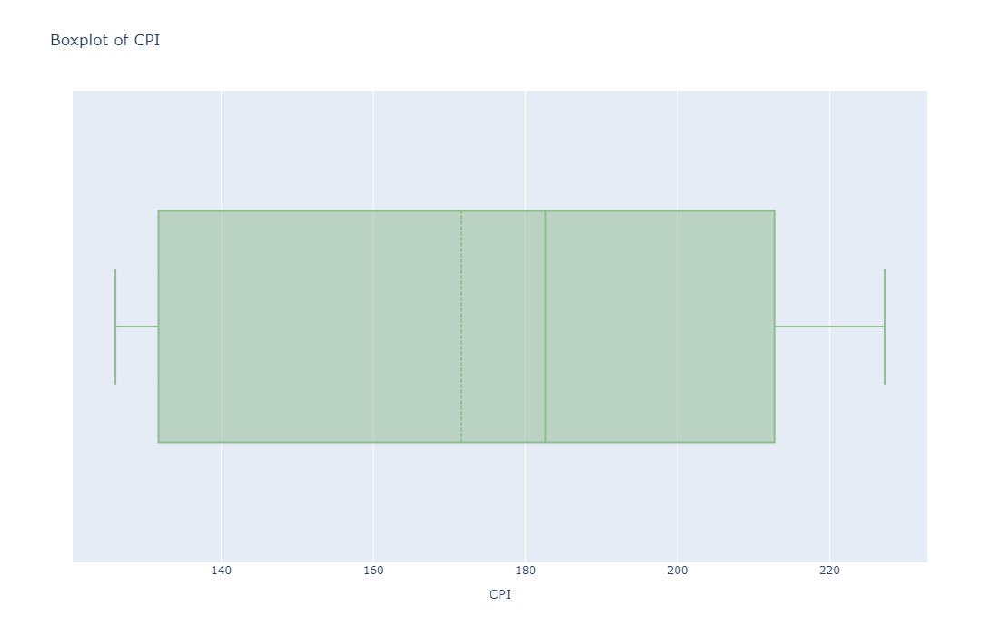

Descriptive Statistics for CPI:
count    6435.000000
mean      171.578394
std        39.356712
min       126.064000
25%       131.735000
50%       182.616521
75%       212.743293
max       227.232807
Name: CPI, dtype: float64
Sum of CPI outliers  0.0


In [18]:
fig = px.box(data, x='CPI', title='Boxplot of CPI')

fig.update_traces(marker=dict(color='darkseagreen', size=5), boxmean=True)


fig.update_layout(
    width=1100, 
    height=700 
)

fig.show()

# Descriptive statistics for Fuel_Price
CPI_stats = data['CPI'].describe()
print("Descriptive Statistics for CPI:")
print(CPI_stats)

# Calculate the interquartile range (IQR)
Q1 = data['CPI'].quantile(0.25)
Q3 = data['CPI'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_CPI = data[((data['CPI'] < lower_bound) | (data['CPI'] > upper_bound))]

print("Sum of CPI outliers ", outliers_CPI['CPI'].sum())

In [19]:
# Add year column and convert Date column to datetime format
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')
data['year'] = pd.DatetimeIndex(data['Date']).year
data['month'] = data['Date'].dt.month_name()

In [20]:
data['year'].unique()

array([2010, 2011, 2012])

In [21]:
# Visualize quantitative variables distributions

In [22]:
def plot_histogram_with_stats(data, column, bins=40, color='plum'):
    # Calculate mean, mode, and median
    mean_value = data[column].mean()
    mode_value = data[column].mode()[0]  # Mode might have multiple values, so we select the first one
    median_value = data[column].median()

    # Plot histogram
    plt.figure(figsize=(20, 8))
    sns.histplot(data[column], bins=bins, kde=True, color=color, alpha=0.5)

    # Add lines for mean, mode, and median
    plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=3, label=f'Mean: {mean_value:.2f}')
    plt.axvline(mode_value, color='black', linestyle='dashed', linewidth=3, label=f'Mode: {mode_value:.2f}')
    plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=3, label=f'Median: {median_value:.2f}')

    # Add legend
    plt.legend()

    # Add title and labels
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    # Show plot
    plt.show()

C:\Users\Arabtech\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



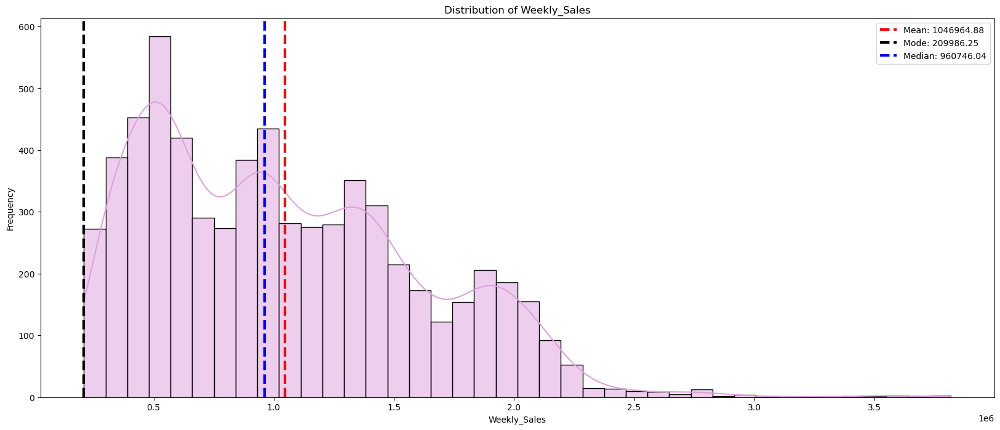

In [23]:
plot_histogram_with_stats(data, 'Weekly_Sales')

C:\Users\Arabtech\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



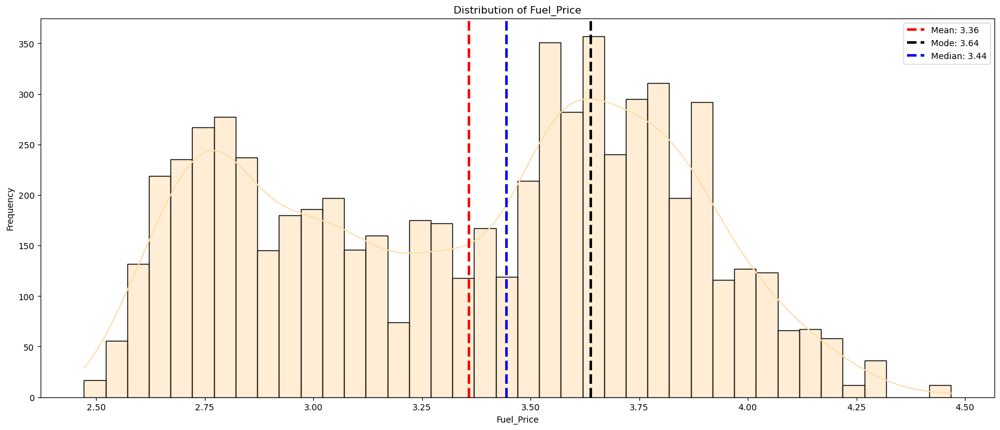

In [24]:
plot_histogram_with_stats(data, 'Fuel_Price',color='navajowhite')

C:\Users\Arabtech\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



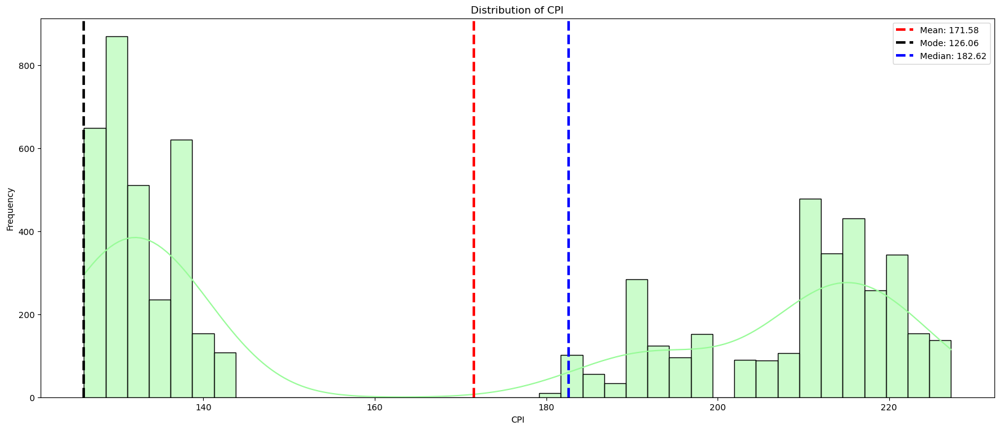

In [25]:
plot_histogram_with_stats(data, 'CPI',color='palegreen')

C:\Users\Arabtech\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



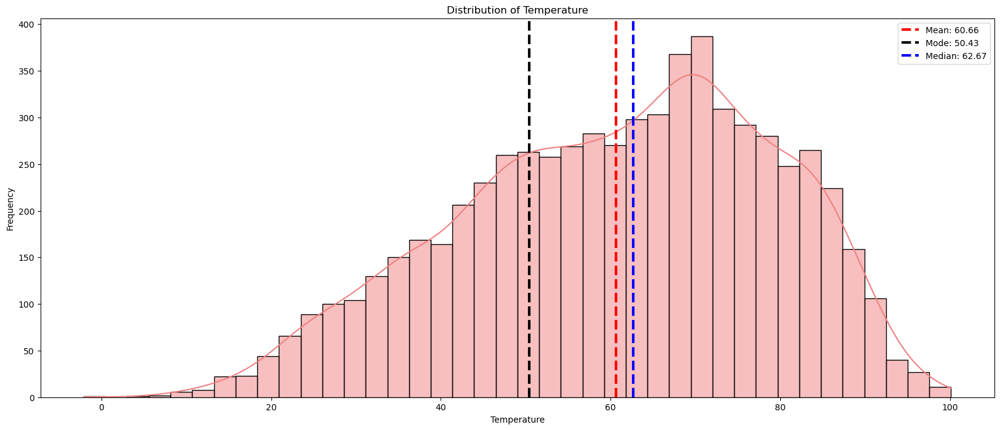

In [26]:
plot_histogram_with_stats(data, 'Temperature',color='lightcoral')

C:\Users\Arabtech\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



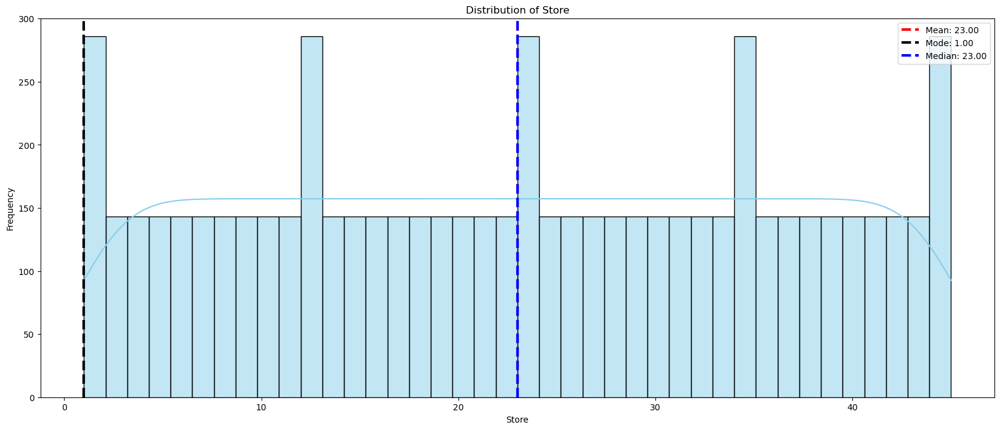

In [27]:
plot_histogram_with_stats(data, 'Store',color='skyblue')

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

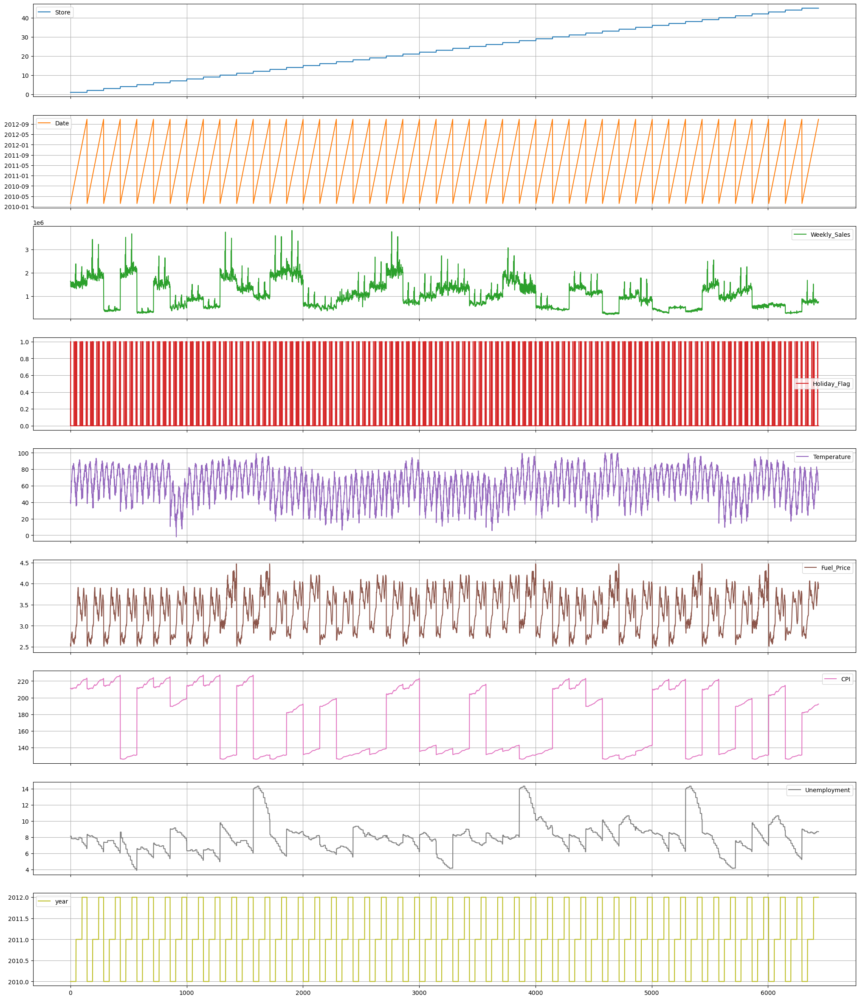

In [28]:
data.plot(subplots=True, grid=True, figsize=(25,30))

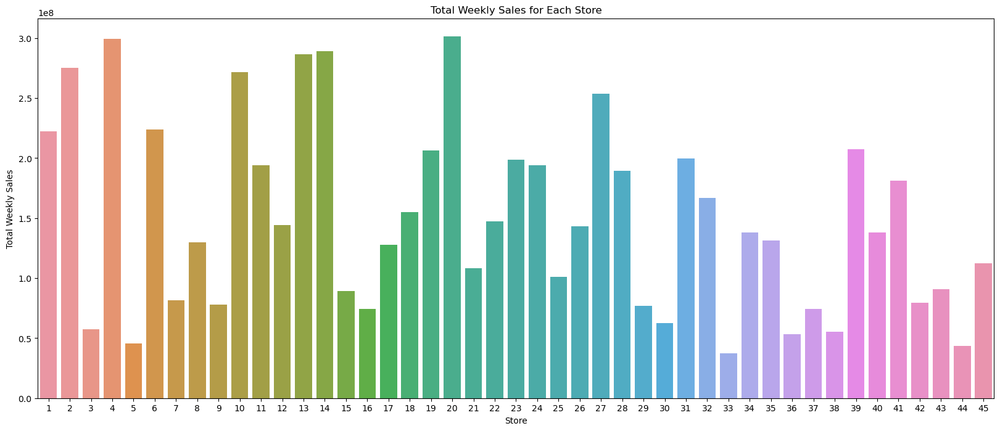

Store with Maximum Sales:
    Store  sum_of_weekly_sales
19     20         3.013978e+08


In [29]:
# a) Which store has maximum sales?
# Calculate the sum of weekly sales for each store
store_sales = data.groupby(['Store'], as_index=False).agg(sum_of_weekly_sales=('Weekly_Sales', "sum"))

# Find the store with the maximum weekly sales
max_sales_store = store_sales[store_sales['sum_of_weekly_sales'] == max(store_sales['sum_of_weekly_sales'])]

# Visualize the total weekly sales for each store on a bar plot
plt.figure(figsize=(20, 8))
sns.barplot(data=store_sales, x="Store", y="sum_of_weekly_sales")
plt.title('Total Weekly Sales for Each Store')
plt.xlabel('Store')
plt.ylabel('Total Weekly Sales')
plt.show()

print("Store with Maximum Sales:")
print(max_sales_store)

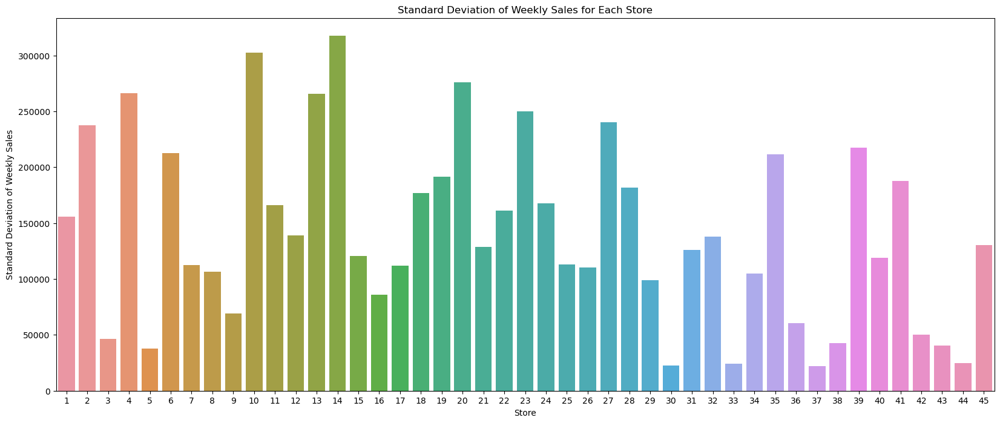

Store with maximum standard deviation:
    Store   Weekly_Sales
13     14  317569.949476


In [30]:
# b) Which store has maximum standard deviation i.e., the sales vary a lot?
# Calculate the standard deviation of weekly sales for each store
store_sd = data.groupby('Store')['Weekly_Sales'].std().reset_index()

# Find the store with the maximum standard deviation
store_max_sd = store_sd[store_sd['Weekly_Sales'] == store_sd['Weekly_Sales'].max()]

# Visualize the standard deviation of weekly sales for each store
plt.figure(figsize=(20, 8))
sns.barplot(x='Store', y='Weekly_Sales', data=store_sd )
plt.title('Standard Deviation of Weekly Sales for Each Store')
plt.xlabel('Store')
plt.ylabel('Standard Deviation of Weekly Sales')
plt.show()

print("Store with maximum standard deviation:")
print(store_max_sd)

In [31]:
# c) Some holidays have a negative impact on sales. We'll find holidays that have higher sales than the mean sales in the non-holiday season for all stores together
# Define the dates of our holidays(Super Bowl - Labour Day - Thanksgiving - Christmas)

def holiday(date):
 if date in ['12-02-2010', '11-02-2011', '10-02-2012']:
  return 'Super Bowl'
 elif date in ['10-09-2010', '09-09-2011', '07-09-2012']:
  return 'Labour Day'
 elif date in ['26-11-2010', '25-11-2011', '23-11-2012']:
  return 'Thanksgiving'
 elif date in ['31-12-2010', '30-12-2011', '28-12-2012']:
  return 'Christmas'
 else:
  return 'Non-Holiday'

# Data frame contains holiday column
holiday_dataframe = data
# change the type of Date to Str to compare with String in the method Above
holiday_dataframe['Date'] = data['Date'].dt.strftime('%d-%m-%Y')
holiday_dataframe['Holiday'] = holiday_dataframe['Date'].apply(holiday)
holiday_dataframe

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,Holiday
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106,2010,February,Non-Holiday
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106,2010,February,Super Bowl
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106,2010,February,Non-Holiday
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106,2010,February,Non-Holiday
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106,2010,March,Non-Holiday
...,...,...,...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684,2012,September,Non-Holiday
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667,2012,October,Non-Holiday
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667,2012,October,Non-Holiday
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667,2012,October,Non-Holiday


In [32]:
# Ccalculate the mean of Weekly_sales for each kind of day
mean_data = holiday_dataframe.groupby("Holiday").agg(mean_weekly_sales =("Weekly_Sales" , "mean"))
mean_data.sort_values(by='mean_weekly_sales', ascending=False)

,mean_weekly_sales
Holiday,
Thanksgiving,1.471273e+06
Super Bowl,1.079128e+06
Labour Day,1.042427e+06
Non-Holiday,1.041256e+06
Christmas,9.608331e+05


In [33]:
# It appears that Thanksgiving has the highest mean weekly sales, followed by Super Bowl, Labour Day, Non-Holiday, and Christmas.
# Thanksgiving , Super Bowl , Labour Day -->have higher sales than the mean sales in the non-holiday season

<Axes: xlabel='Holiday', ylabel='mean_weekly_sales'>

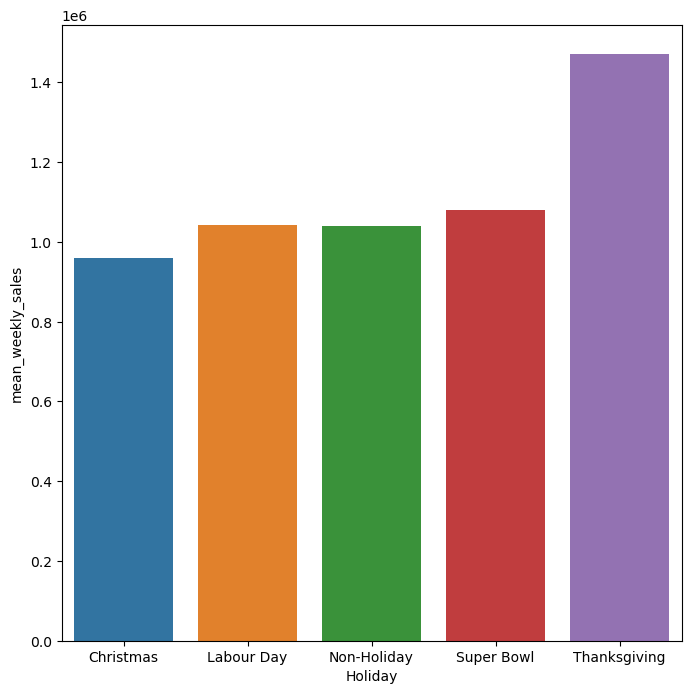

In [34]:
# visualize it with barplot
plt.subplots(figsize =(8, 8))
sns.barplot(data=mean_data , x = mean_data.index , y=mean_data['mean_weekly_sales'])

In [42]:
# Add year column and convert Date column to datetime format
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')
data['Year'] = pd.DatetimeIndex(data['Date']).year
data['month'] = data['Date'].dt.month_name()

C:\Users\Arabtech\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



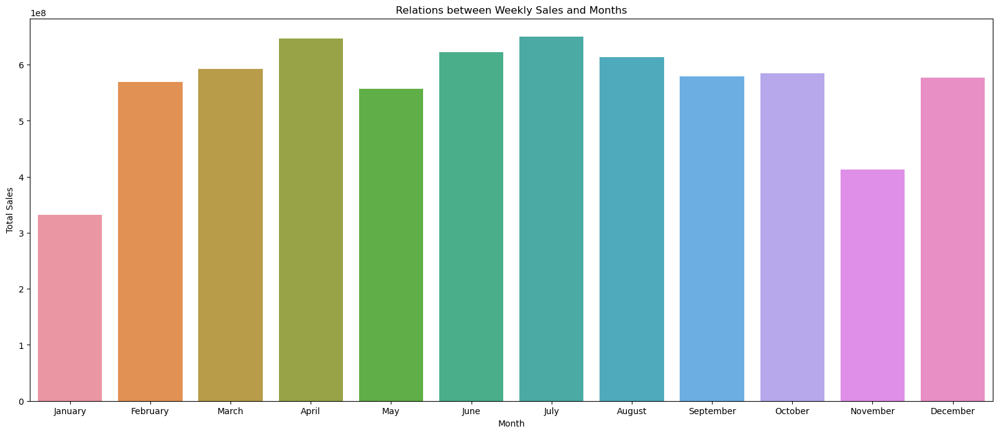

In [43]:
# d) Provide a monthly and semester view of sales in units and give insights.
# Get total sales in each month
month_sales = data.groupby('month')[['Weekly_Sales']].sum()

# Define custom order for months
custom_month_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

# Reindex with custom order
month_sales = month_sales.reindex(custom_month_order)

# Visualize the relationship between weekly sales and months
plt.subplots(figsize=(20, 8))
sns.barplot(data=month_sales, x=custom_month_order, y='Weekly_Sales')
plt.title('Relations between Weekly Sales and Months')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.show()


In [44]:
# From this figure we notice that july has the most weekl_sales and january has the lowest weekl_sales
# The sales is decreasing in january and november and increasing in july and April

<Figure size 1000x600 with 0 Axes>

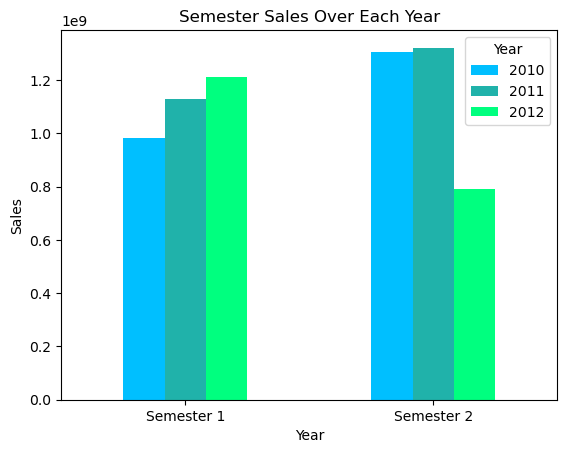

In [45]:
# Ensure the 'Date' column is in the correct datetime format
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')

# Initialize a dictionary to store semester sales for each year
semester_sales_by_year = {}

# Iterate over each year
for year in data['Year'].unique():
    year_data = data[data['Year'] == year]
    
    semester1_sales = year_data[(year_data['Date'].dt.month >= 1) & (year_data['Date'].dt.month <= 6)]['Weekly_Sales'].sum()
    semester2_sales = year_data[(year_data['Date'].dt.month >= 7) & (year_data['Date'].dt.month <= 12)]['Weekly_Sales'].sum()
    
    semester_sales_by_year[year] = {'Semester 1': semester1_sales, 'Semester 2': semester2_sales}

# Convert the dictionary to a DataFrame
semester_sales_df = pd.DataFrame(semester_sales_by_year)

# Plot semester sales
plt.figure(figsize=(10, 6))
semester_sales_df.plot(kind='bar', color=['deepskyblue', 'lightseagreen' , 'springgreen'])
plt.title('Semester Sales Over Each Year')
plt.xlabel('Year')
plt.ylabel('Sales')
plt.xticks(rotation=0)
plt.legend(title='Year')
plt.show()

In [46]:
# Generally sales in semester 2 (Jul-Dec) are higher than sales in semester 1 (Jan-Jun)
# Semester 1: Weekly sales increase during the three years 2010, 1011 and 2012. While in semester 2, we note that weekly sales decreased in 2012
# Back to Major holidays , Back-to-school season , Summer vacations ,and End-of-year 

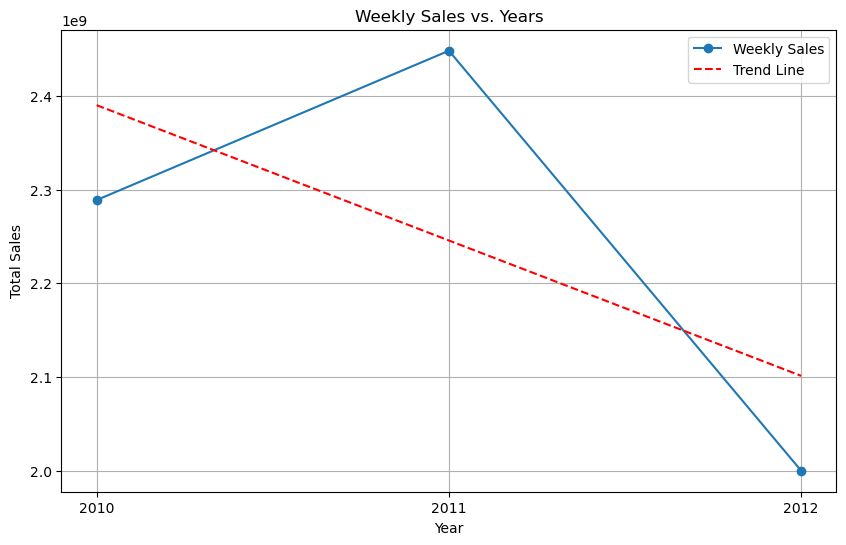

In [47]:
# Group by year and sum the weekly sales
yearly_sales = data.groupby(data['Date'].dt.year)['Weekly_Sales'].sum()

# Fit a polynomial trend line
coefficients = np.polyfit(yearly_sales.index, yearly_sales.values, 1)
trend_line = np.poly1d(coefficients)

# Plot weekly sales vs. years with trend line
plt.figure(figsize=(10, 6))
plt.plot(yearly_sales.index, yearly_sales.values, marker='o', linestyle='-', label='Weekly Sales')
plt.plot(yearly_sales.index, trend_line(yearly_sales.index), linestyle='--', color='red', label='Trend Line')
plt.title('Weekly Sales vs. Years')
plt.xlabel('Year')
plt.ylabel('Total Sales')
plt.xticks(yearly_sales.index)
plt.legend()
plt.grid(True)
plt.show()



In [48]:
# 2011 saw the highest sales, suggesting successful strategies or favorable market conditions.
# The trend line indicates a decreasing trend in weekly sales over the years, suggesting a general decline in sales performance.
# Businesses need to innovate and adapt to maintain or increase sales through changing market strategies

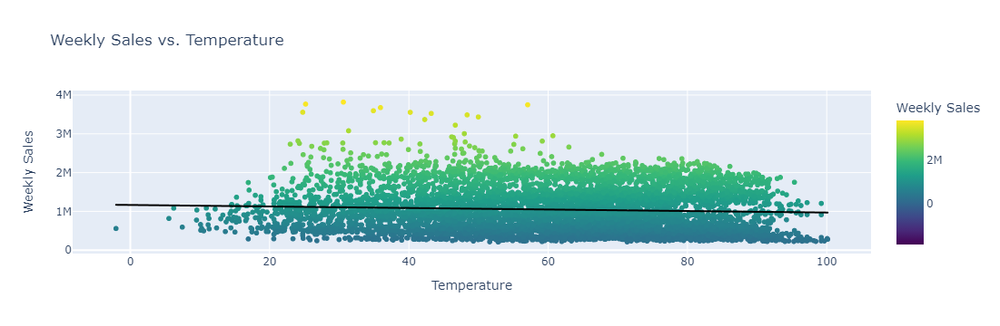

In [49]:
# e) Plot the relations between weekly sales vs. other numeric features and give insights.
# For 'Temperature' feature
fig = px.scatter(data, x="Temperature", y="Weekly_Sales", trendline="ols",
                 title="Weekly Sales vs. Temperature",
                 labels={"Temperature": "Temperature", "Weekly_Sales": "Weekly Sales"},
                 color="Weekly_Sales",  # Color based on Weekly Sales
                 color_continuous_scale="viridis",  # Use the Viridis color scale
                 color_continuous_midpoint=data['Weekly_Sales'].median(),  # Set midpoint to median value
                 )

fig.update_traces(line=dict(color="black"))
fig.show()

In [50]:
# Sales increase in tempreture range[20 , 60]

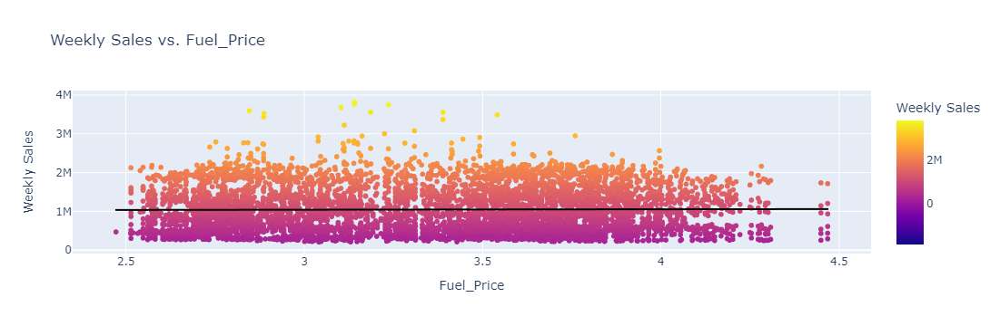

In [51]:
# For 'Fuel_Price' feature
fig = px.scatter(data, x="Fuel_Price", y="Weekly_Sales", trendline="ols",
                 title="Weekly Sales vs. Fuel_Price",
                 labels={"Fuel_Price": "Fuel_Price", "Weekly_Sales": "Weekly Sales"},
                 color="Weekly_Sales",  # Color based on Weekly Sales
                 color_continuous_scale="plasma",
                 color_continuous_midpoint=data['Weekly_Sales'].median(),  # Set midpoint to median value
                 )

fig.update_traces(line=dict(color="black"))
fig.show()

In [52]:
# When the fuel_price range in[2.8 , 3.7] the weekly sales increased, weekly sales decreasing when the fuel price increasing
# Result of factors such as increased consumer spending power, lower transportation costs, economic conditions,.. .

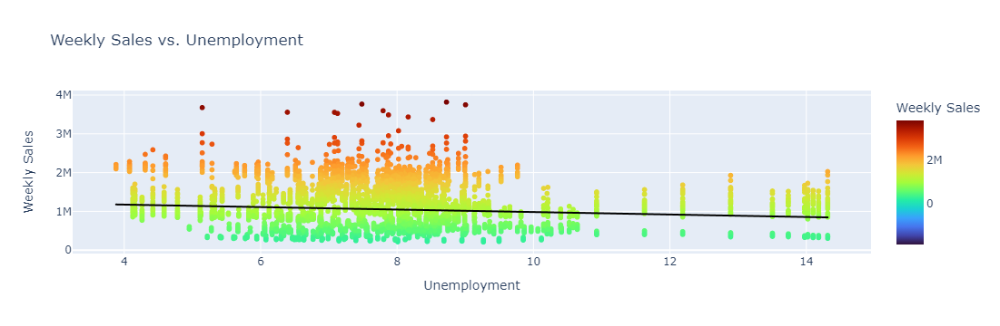

In [53]:
# For 'Unemployment' feature
fig = px.scatter(data, x="Unemployment", y="Weekly_Sales", trendline="ols",
                 title="Weekly Sales vs. Unemployment",
                 labels={"Unemployment": "Unemployment", "Weekly_Sales": "Weekly Sales"},
                 color="Weekly_Sales",  # Color based on Weekly Sales
                 color_continuous_scale="Turbo",
                 color_continuous_midpoint=data['Weekly_Sales'].median(),  # Set midpoint to median value
                 )

fig.update_traces(line=dict(color="black"))
fig.show()

In [54]:
#  When the Unemployment range in[5 , 9] the weekly sales increased,weekly sales decreasing when the Unemployment increasing

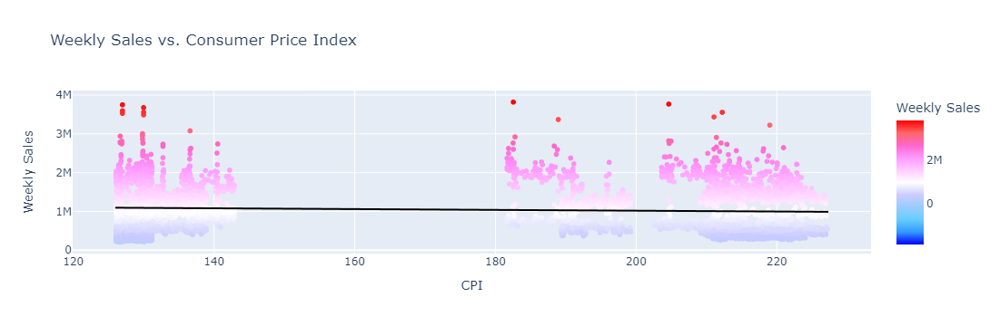

In [56]:
# For 'CPI' feature
fig = px.scatter(data, x="CPI", y="Weekly_Sales", trendline="ols",
                 title="Weekly Sales vs. Consumer Price Index",
                 labels={"Consumer Price Index": "CPI", "Weekly_Sales": "Weekly Sales"},
                 color="Weekly_Sales",  # Color based on Weekly Sales
                 color_continuous_scale="Picnic",
                 color_continuous_midpoint=data['Weekly_Sales'].median(),
                 )

fig.update_traces(line=dict(color="black"))
fig.show()

In [57]:
# The CPI increases, weekly sales tend to decrease. There are however some data points that go against this trend.
# The relationship between weekly sales and CPI is not very strong , weekly sales are zero when CPI between (143 , 181). 
# There are many factors other than CPI that can influence weekly sales.

C:\Users\Arabtech\AppData\Local\Temp\ipykernel_7316\1503810039.py:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\Arabtech\AppData\Local\Temp\ipykernel_7316\1503810039.py:42: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



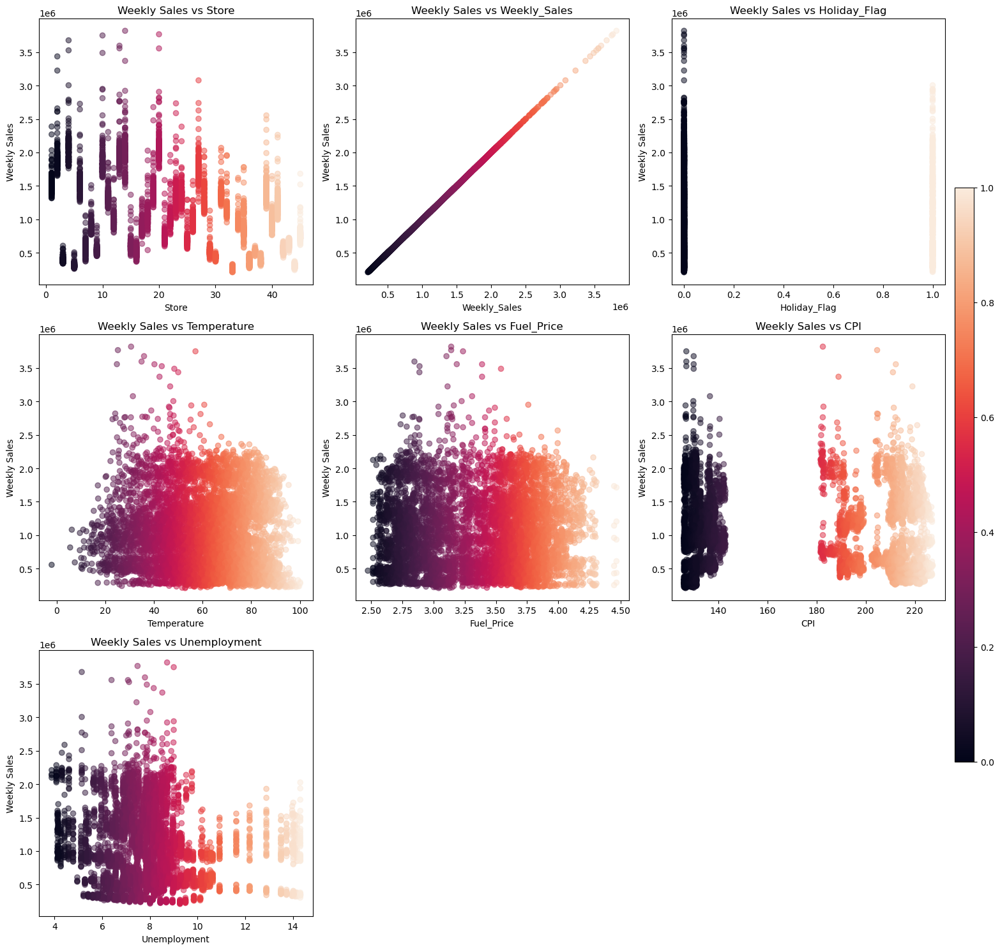

In [58]:
numeric_features = data.select_dtypes(include=['float64', 'int64']).columns

# Define the colormap
colormap = plt.cm.get_cmap('rocket')

# Define the number of rows and columns for subplots
num_rows = len(numeric_features) // 3 + (len(numeric_features) % 3 > 0)
num_cols = min(3, len(numeric_features))

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

# Flatten the axis array if only one row
if num_rows == 1:
    axs = [axs]

for i, feature in enumerate(numeric_features):
    row = i // num_cols
    col = i % num_cols
    
    # Normalize the feature values to range [0, 1] for colormap
    normalized_values = (data[feature] - data[feature].min()) / (data[feature].max() - data[feature].min())
    
    # Plot scatter plot with colormap
    im = axs[row][col].scatter(data[feature], data['Weekly_Sales'], c=normalized_values, cmap=colormap, alpha=0.5)
    axs[row][col].set_xlabel(feature)
    axs[row][col].set_ylabel('Weekly Sales')
    axs[row][col].set_title(f'Weekly Sales vs {feature}')

# Hide empty subplots
for i in range(len(numeric_features), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axs[row][col].axis('off')

# Add colorbar
cax = fig.add_axes([1, 0.2, 0.02, 0.6])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=0, vmax=1))
sm.set_array([])
plt.colorbar(sm, cax=cax, orientation='vertical')

plt.tight_layout()
plt.show()
